## **Image Programming Assignment 2**

In [174]:
#IMPORTING LIBRARIES
from PIL import Image
from skimage.util import random_noise
import matplotlib.pyplot as plt
import numpy as np
import cv2
from scipy import ndimage

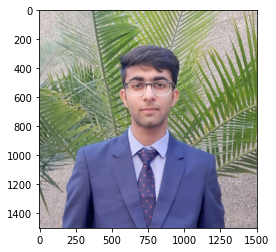

In [175]:
#Reading the image 'San.png' 
original_image = cv2.imread("San.png")
plt.imshow(cv2.cvtColor(original_image,cv2.COLOR_BGR2RGB))
plt.show()

In [176]:
print(original_image.shape)

(1502, 1503, 3)


### **Adding Noise to Image**

In [177]:
#converting the original image into array
original_image_array = np.asarray(original_image)

#### **1. Gaussian Noise**

In [178]:
# random_noise() method will convert the image in [0, 255] to [0, 1.0],
# inherently it use np.random.normal() to create normal distribution
gaussian_noise_image = random_noise(original_image_array, mode='gaussian', var=0.3)

In [179]:
#converting generated array back to image
gaussian_noise_image = (255*gaussian_noise_image).astype(np.uint8)

Text(0.5, 1.0, 'Gaussian Noise Image')

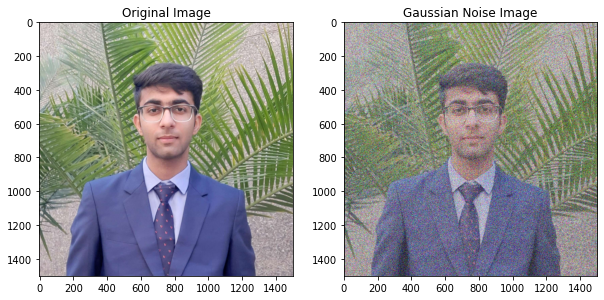

In [180]:
#plotting the borth original_image and gaussian_noise_image
fig=plt.figure(figsize=(10,10))
rows = 1
columns =2

fig.add_subplot(rows,columns,1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

fig.add_subplot(rows,columns,2)
plt.imshow(cv2.cvtColor(gaussian_noise_image,cv2.COLOR_BGR2RGB))
plt.title("Gaussian Noise Image")

#### **2. Salt & Pepper Noise**

In [181]:
# salt-and-pepper noise can be applied only to grayscale images
# Reading the color image in grayscale image
grayscale_image = cv2.imread('San.png',cv2.IMREAD_GRAYSCALE)

In [182]:
#converting the original image into array
grayscale_image_array = np.asarray(grayscale_image)

In [183]:
# random_noise() method will convert image in [0, 255] to [0, 1.0],
# inherently it use np.random.normal() to create normal distribution
salt_pepper_noise_image = random_noise(grayscale_image_array, mode='s&p', amount=0.3)

In [184]:
#converting generated array back to image
salt_pepper_noise_image = (255*salt_pepper_noise_image).astype(np.uint8)

Text(0.5, 1.0, 'Salt Pepper Noise image')

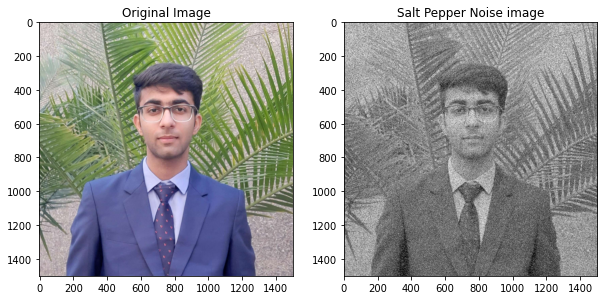

In [185]:
#plotting the borth original_image and salt_pepper_noise_image
fig=plt.figure(figsize=(10,10))
rows = 1
columns =2

fig.add_subplot(rows,columns,1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

fig.add_subplot(rows,columns,2)
plt.imshow(cv2.cvtColor(salt_pepper_noise_image,cv2.COLOR_BGR2RGB))
plt.title("Salt Pepper Noise image")

### **Edge Detection Techniques**

Text(0.5, 1.0, 'Salt Pepper Noise Image')

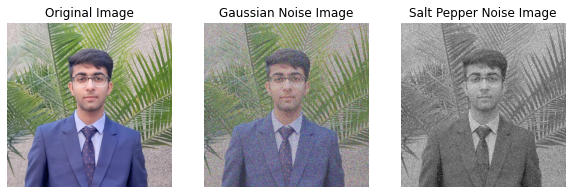

In [186]:
#plotting the three images together that we have to work on
fig=plt.figure(figsize=(10,10))
rows = 1
columns = 3

fig.add_subplot(rows,columns,1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Original Image")

fig.add_subplot(rows,columns,2)
plt.imshow(cv2.cvtColor(gaussian_noise_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Gaussian Noise Image")

fig.add_subplot(rows,columns,3)
plt.imshow(cv2.cvtColor(salt_pepper_noise_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Salt Pepper Noise Image")

#### **1. Prewitt Edge Detection**

In [187]:
def is_gray(checkImage):
    if len(checkImage.shape) < 3: 
        return True
    if checkImage.shape[2]  == 1: 
        return True
    b,g,r = checkImage[:,:,0], checkImage[:,:,1], checkImage[:,:,2]
    if (b==g).all() and (b==r).all(): 
        return True
    return False

In [188]:
# function to apply Prewitt edge detection
def Prewitt_Edge_Detection(image,label):

    #defining horizontal and Vertical sobel kernels
    var = image
    if is_gray(image) == False:
        image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    Hx = np.array([[-1, 0, 1],[-1, 0, 1],[-1, 0, 1]])
    Hy = np.array([[-1, -1, -1],[0, 0, 0],[1, 1, 1]])

    #normalizing the vectors
    pre_x = ndimage.convolve(image, Hx) / 6.0
    pre_y = ndimage.convolve(image, Hy) / 6.0

    #calculate the gradient magnitude of vectors
    pre_out = np.sqrt(np.power(pre_x, 2) + np.power(pre_y, 2))
    # mapping values from 0 to 255
    pre_out = ((pre_out / np.max(pre_out)) * 255)
    pre_out = pre_out.astype('float32')
    pre_out = pre_out.astype(np.uint8)
    
    #plotting the given image with prewitt edge detection image
    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(var,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(pre_out,cv2.COLOR_BGR2RGB))
    plt.xlabel("Prewitt Edge detection Image")
    
    plt.show()

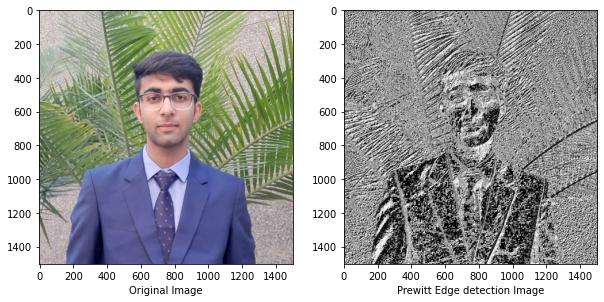

In [189]:
# applying Prewitt edge detection technique on original image
Prewitt_Edge_Detection(original_image,"Original Image")

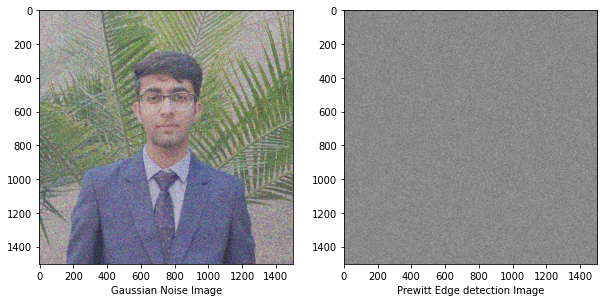

In [190]:
# applying Prewitt edge detection technique on Gaussian Noise Image
Prewitt_Edge_Detection(gaussian_noise_image,"Gaussian Noise Image")

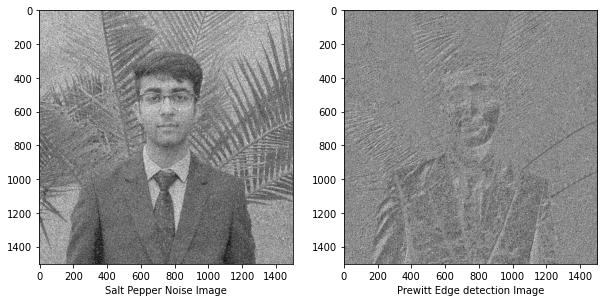

In [191]:
# applying Prewitt edge detection technique on Salt Pepper Noise Image
Prewitt_Edge_Detection(salt_pepper_noise_image,"Salt Pepper Noise Image")

#### **2. Sobel Edge Detection Tecgnique**

In [192]:
# function to apply sobel edge detection
def sobel_edge_detection(image,label):
    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0)
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1)
    grad = np.sqrt(grad_x**2 + grad_y**2)
    grad_norm = (grad * 255 / grad.max()).astype(np.uint8)

    #plotting the given image and the sobel edge detection image
    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(grad_norm,cv2.COLOR_BGR2RGB))
    plt.xlabel("Sobel Edge detection Image")
    plt.show()

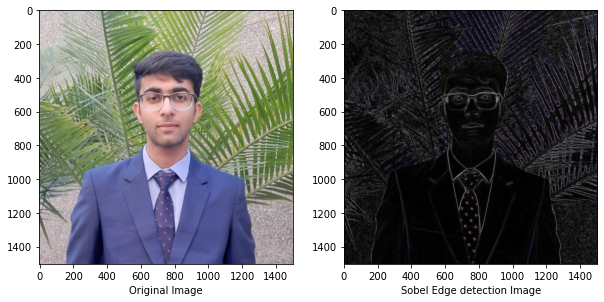

In [193]:
# applying sobel edge detection technique on original image
sobel_edge_detection(original_image,"Original Image")

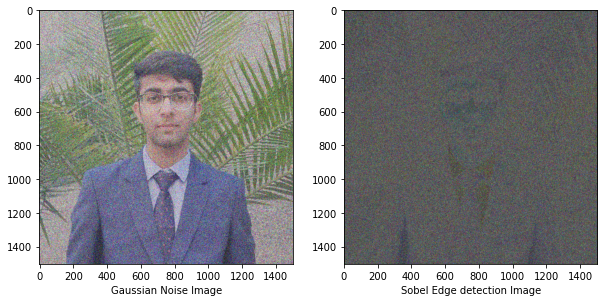

In [194]:
# applying sobel edge detection technique with gaussian noise image
sobel_edge_detection(gaussian_noise_image,"Gaussian Noise Image")

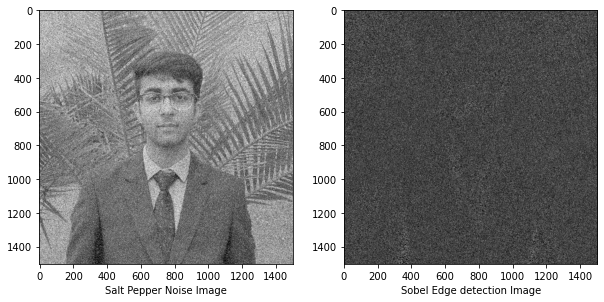

In [195]:
# applying sobel edge detection technique with salt pepper noise image
sobel_edge_detection(salt_pepper_noise_image,"Salt Pepper Noise Image")

#### **3. Laplacian Edge Detection**

In [196]:
def laplacian_Edge_Detection(image,label):

    laplacian = cv2.Laplacian(image,5,cv2.CV_64F)
    filtered_image = cv2.convertScaleAbs(laplacian)
    
    #plotting the given image and the laplacian edge detection image
    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(filtered_image,cv2.COLOR_BGR2RGB))
    plt.xlabel("Laplacian Edge detection Image")
    plt.show()

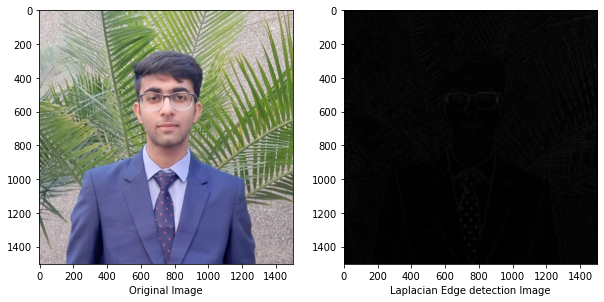

In [197]:
# applying laplacian edge detection technique on original image
laplacian_Edge_Detection(original_image,"Original Image")

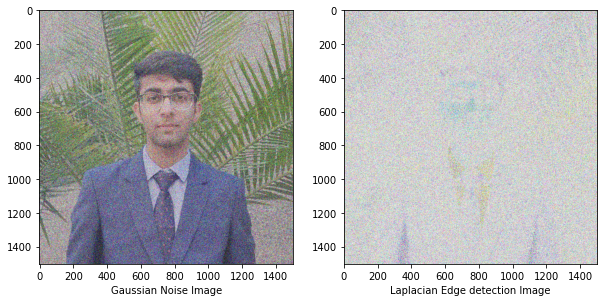

In [198]:
# applying laplacian edge detection technique on Gaussian Noise image
laplacian_Edge_Detection(gaussian_noise_image,"Gaussian Noise Image")

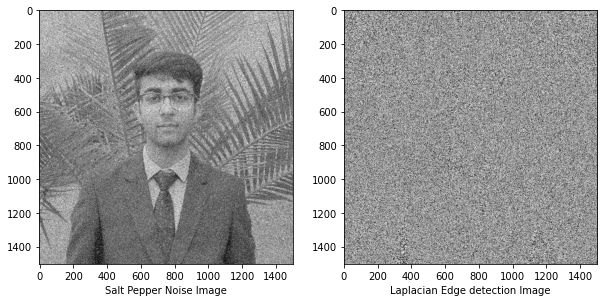

In [199]:
# applying laplacian edge detection technique on Salt Pepper Noise image
laplacian_Edge_Detection(salt_pepper_noise_image,"Salt Pepper Noise Image")

#### **4. Canny Edge Detection**

In [200]:
def Canny_Edge_Detection(img,label):

    edges = cv2.Canny(image=img, threshold1=100, threshold2=200)
    
    #plotting the given image and the laplacian edge detection image
    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(edges,cv2.COLOR_BGR2RGB))
    plt.xlabel("Canny Edge detection Image")
    plt.show()

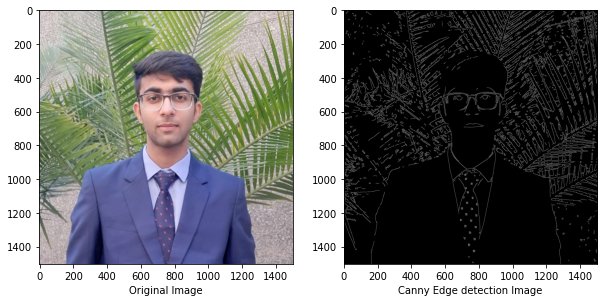

In [201]:
# applying Canny edge detection technique on original image
Canny_Edge_Detection(original_image,"Original Image")

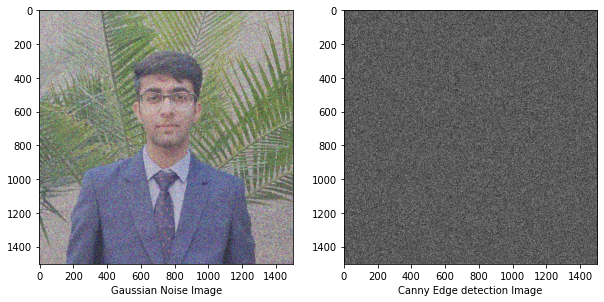

In [202]:
# applying laplacian edge detection technique on Gaussian Noise Image
Canny_Edge_Detection(gaussian_noise_image,"Gaussian Noise Image")

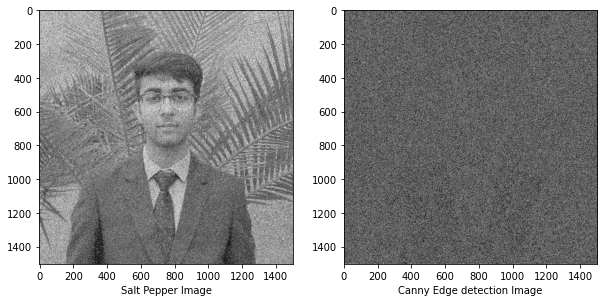

In [203]:
# applying laplacian edge detection technique on Salt & Pepper Noise
Canny_Edge_Detection(salt_pepper_noise_image,"Salt Pepper Image")

#### **5. Robert Edge Detection**

In [204]:
def Robert_Edge_Detection(img,label):
    roberts_cross_v = np.array([[1,0],
                                [0,-1]])
    roberts_cross_h = np.array([[0,1],
                                [-1,0]])
    tempImg = img
    if is_gray(tempImg) == False:
        tempImg = cv2.cvtColor(tempImg,cv2.COLOR_BGR2GRAY)
        tempImg = tempImg/255.0
    vertical = ndimage.convolve( tempImg, roberts_cross_v )
    horizontal = ndimage.convolve( tempImg, roberts_cross_h )
    edged_img = np.sqrt( np.square(horizontal) + np.square(vertical))
    edged_img*=255
    edged_img = edged_img.astype('float32')
    edged_img = edged_img.astype(np.uint8)
    # plt.imshow(cv2.cvtColor(edged_img,cv2.COLOR_GRAY2RGB))

    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(edged_img,cv2.COLOR_GRAY2RGB))
    plt.xlabel("Robert Edge detection applied")
    
    plt.show()

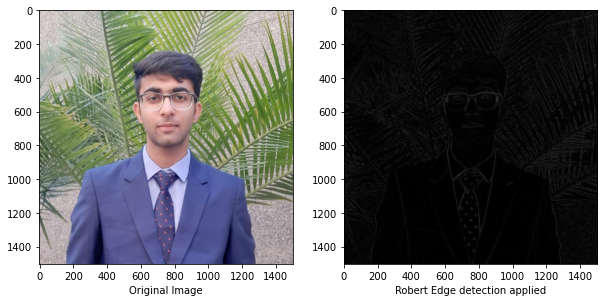

In [205]:
# applying Robert edge detection technique on original image
Robert_Edge_Detection(original_image,"Original Image")

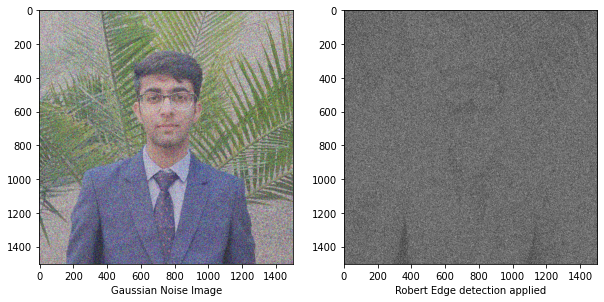

In [206]:
# applying Robert edge detection technique on Gaussian Noise Image
Robert_Edge_Detection(gaussian_noise_image,"Gaussian Noise Image")

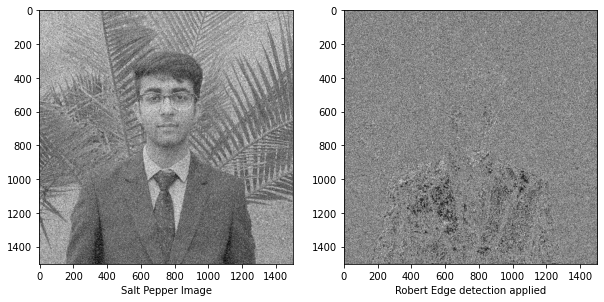

In [207]:
# applying Robert edge detection technique on Salt Pepper Image
Robert_Edge_Detection(salt_pepper_noise_image,"Salt Pepper Image")

### **Thresholding Techniques**

#### **1. Simple Thresholding/Binary Thresholding**

In [208]:
#defining simple thresholding function
def Simple_Thresholding(img,label):
    ret,thresh=cv2.threshold(img,130,255,cv2.THRESH_BINARY)
    
    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(thresh,cv2.COLOR_BGR2RGB))
    plt.xlabel("Simple Thresholding Image")
    
    plt.show()

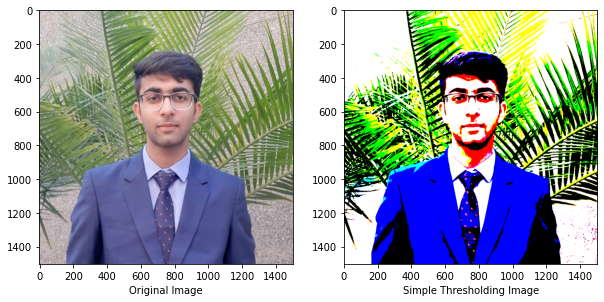

In [209]:
# applying Simple Thresholding technique on Original Image
Simple_Thresholding(original_image,"Original Image")

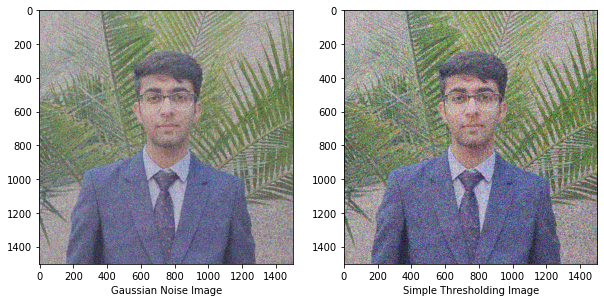

In [210]:
# applying Simple Thresholding technique on Gaussian Noise Image
Simple_Thresholding(gaussian_noise_image,"Gaussian Noise Image")

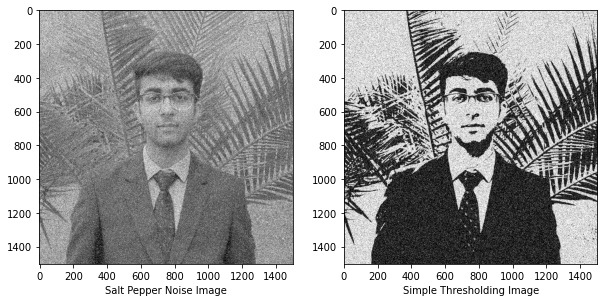

In [211]:
# applying Simple Thresholding technique on Salt Pepper Noise Image
Simple_Thresholding(salt_pepper_noise_image,"Salt Pepper Noise Image")

#### **2. Adaptive Thresholding**

##### **(a) Mean Adaptive Thresholding**

In [212]:
#defining Mean Adaptive Thresholding function
def Mean_Adaptive_Thresholding(img,label):
    thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)

    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(thresh,cv2.COLOR_BGR2RGB))
    plt.xlabel("Mean Adaptive Thresholding Image")
    
    plt.show()

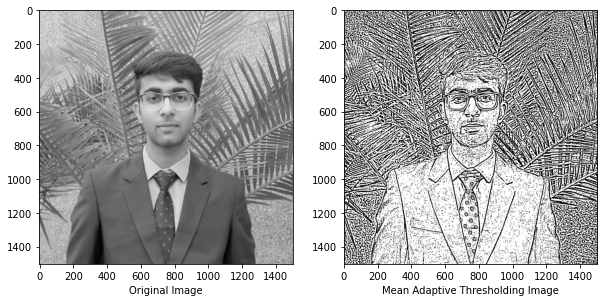

In [213]:
#applying Mean Adaptive thresholding technqiue on gray scale original image
Original_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
Mean_Adaptive_Thresholding(Original_image_gray,"Original Image")

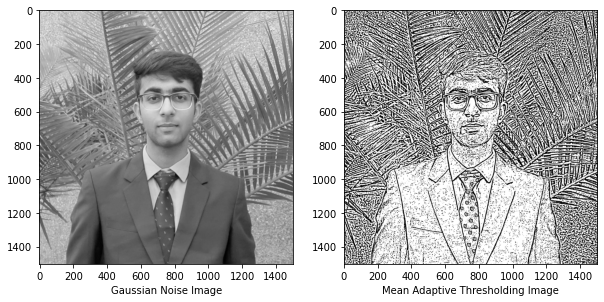

In [214]:
#applying Mean Adaptive thresholding technqiue on gray scale Gaussian Noise Image
gaussian_noise_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
Mean_Adaptive_Thresholding(gaussian_noise_image_gray,"Gaussian Noise Image")

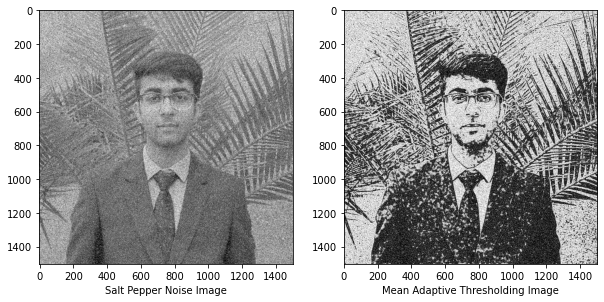

In [215]:
#applying Mean Adaptive thresholding technqiue on Salt Pepper Noise Image
Mean_Adaptive_Thresholding(salt_pepper_noise_image,"Salt Pepper Noise Image")

##### **(b) Gaussian Thresholding**

In [216]:
#defining gaussian thresholding function
def Gaussian_Thresholding(img,label):
    thresh = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(thresh,cv2.COLOR_BGR2RGB))
    plt.xlabel("Gaussian Thresholding Image")
    
    plt.show()

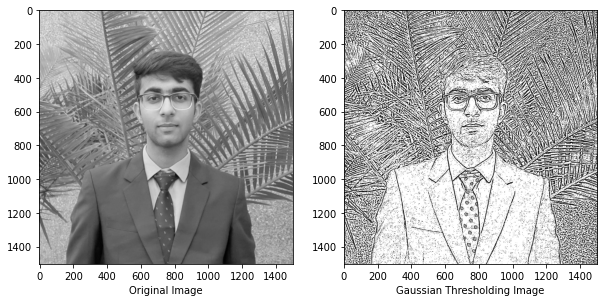

In [217]:
#applying Gaussian thresholding technqiue on gray scale original image
Original_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
Gaussian_Thresholding(Original_image_gray,"Original Image")

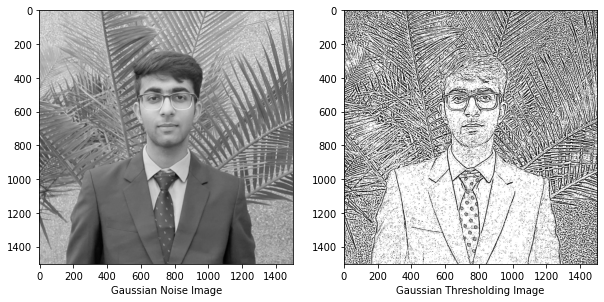

In [218]:
#applying Gaussian thresholding technqiue on gray scale Gaussian Noise Image
gaussian_noise_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
Gaussian_Thresholding(gaussian_noise_image_gray,"Gaussian Noise Image")

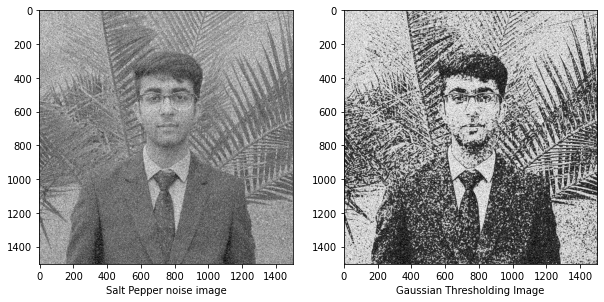

In [219]:
#applying Gaussian thresholding technqiue on  Salt Pepper noise image
Gaussian_Thresholding(salt_pepper_noise_image,"Salt Pepper noise image")

#### **3. Ostu’s Thresholding**

In [220]:
#defining ostu's thresholding function
def Ostus_Thresholding(img,label):
    rect1,thresh=cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    fig = plt.figure(figsize=(10,10))
    rows = 1
    columns = 2

    fig.add_subplot(rows,columns,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.xlabel(label)

    fig.add_subplot(rows,columns,2)
    plt.imshow(cv2.cvtColor(thresh,cv2.COLOR_BGR2RGB))
    plt.xlabel("Ostu's Thresholding Image")
    
    plt.show()

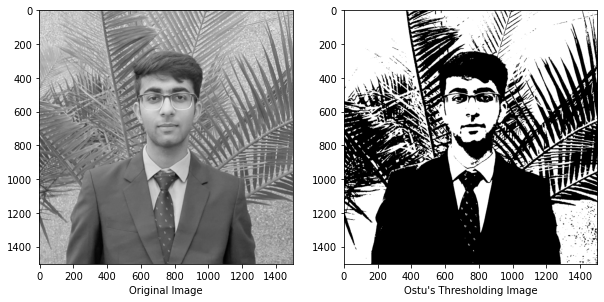

In [221]:
#applying Ostu's thresholding technqiue on gray scale original image
Original_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
Ostus_Thresholding(Original_image_gray,"Original Image")

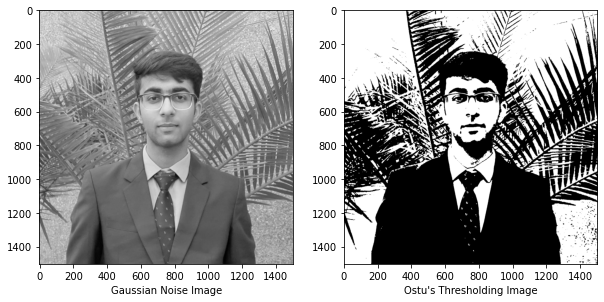

In [222]:
#applying Mean Adaptive thresholding technqiue on gray scale Gaussian Noise Image
gaussian_noise_image_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
Ostus_Thresholding(gaussian_noise_image_gray,"Gaussian Noise Image")

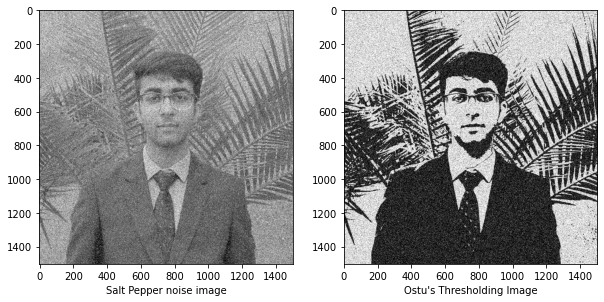

In [223]:
#applying Mean Adaptive thresholding technqiue on Salt Pepper noise image
Ostus_Thresholding(salt_pepper_noise_image,"Salt Pepper noise image")